# Image Background removal

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [6]:
image_path = "/content/sample_data/view1.jpeg"

In [7]:
image = cv2.imread(image_path)

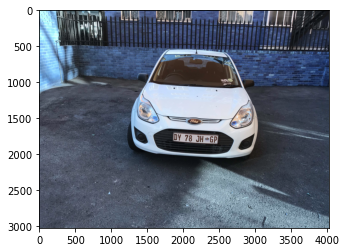

In [8]:
plt.imshow(image)

In [9]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

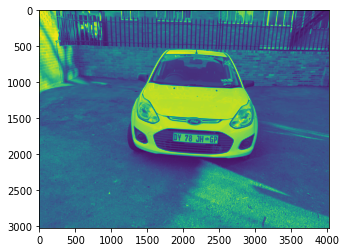

In [10]:
plt.imshow(image_gray)

In [11]:
image_blurred = cv2.GaussianBlur(image, (9, 9), 0)

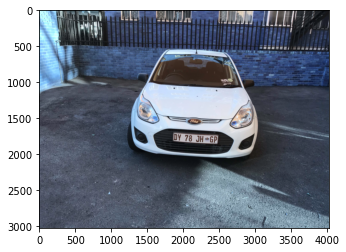

In [12]:
plt.imshow(image_blurred)

In [13]:
# Edge detection 
edges = cv2.Canny(image_gray, 100, 200)
edges = cv2.dilate(edges, None)
edges = cv2.erode(edges, None)

In [14]:
# Find contours in edges, sort by area 
contour_info = []
contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
for c in contours:
    contour_info.append((
        c,
        cv2.isContourConvex(c),
        cv2.contourArea(c),
    ))
contour_info = sorted(contour_info, key=lambda c: c[2], reverse=True)
max_contour = contour_info[0]

In [15]:
# Create empty mask and flood fill
mask = np.zeros(edges.shape)
for c in contour_info:
    cv2.fillConvexPoly(mask, c[0], (255))

In [16]:
# Smooth mask and blur it
mask = cv2.dilate(mask, None, iterations=10)
mask = cv2.erode(mask, None, iterations=10)
mask = cv2.GaussianBlur(mask, (21, 21), 0)

In [17]:
# Create 3-channel alpha mask
mask_stack = np.dstack([mask]*3)

In [18]:
# Blend mask and foreground image
mask_stack  = mask_stack.astype('float32') / 255.0  
image  = image.astype('float32') / 255.0    
masked = (mask_stack * image ) + ((1-mask_stack) * (1.0,1.0,1.0))
masked = (masked * 255).astype('uint8')     

In [19]:
# Make the background transparent by adding 4th alpha channel
tmp = cv2.cvtColor(masked, cv2.COLOR_BGR2GRAY)
_,alpha = cv2.threshold(tmp,0,255,cv2.THRESH_BINARY)
b, g, r = cv2.split(masked)
rgba = [b,g,r, alpha]
dst = cv2.merge(rgba,4)

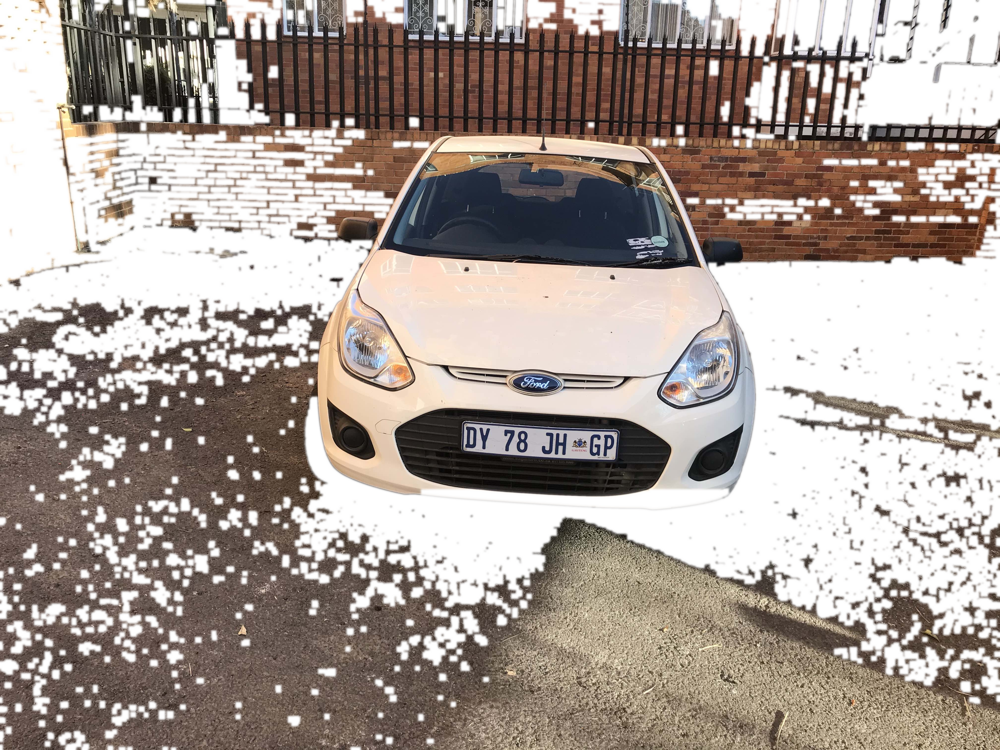

saved the output image in output.png


In [21]:
# Display
from google.colab.patches import cv2_imshow
cv2_imshow(dst)
cv2.waitKey()
cv2.imwrite("output.png",dst)
print("saved the output image in output.png")